# Reto 5 - Convoluciones para filtrado

## 1. Imagen original

Se parte de una imagen limpia que posteriormente será alterada agregando ruido tipo salt & pepper. Luego se aplicarán diferentes filtros para intentar recuperar la imagen.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

ruta_imagen = "imagenes/imagen_colores.jpg"

imagen = cv2.imread(ruta_imagen)

if imagen is None:
    print("Error: no se pudo cargar la imagen.")
else:
    print("Imagen cargada correctamente.")
    print("Shape:", imagen.shape)

Imagen cargada correctamente.
Shape: (455, 728, 3)


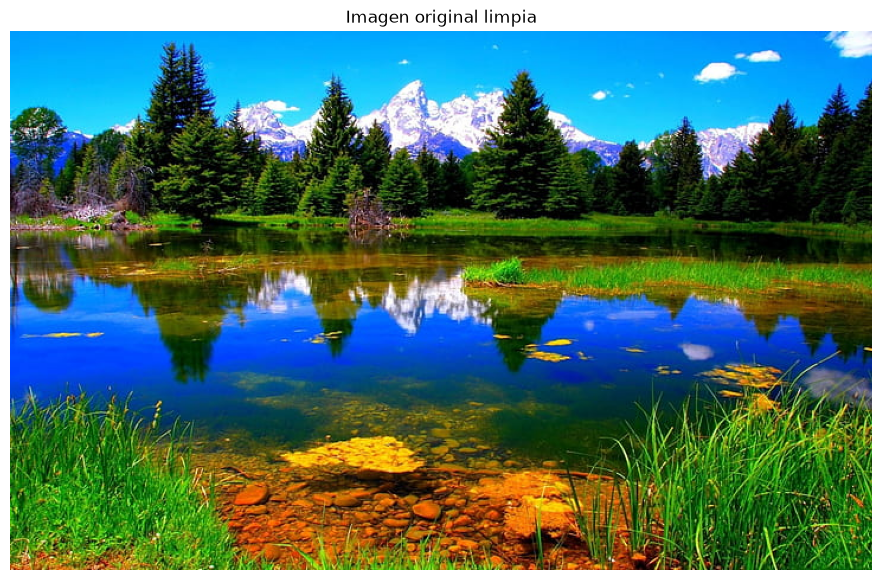

In [2]:
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_rgb)
plt.title("Imagen original limpia")
plt.axis("off")
plt.show()

## 2. Adición de ruido Salt & Pepper

Se agrega ruido tipo salt & pepper de forma manual. Este ruido reemplaza aleatoriamente algunos píxeles por valores extremos:

- Salt (sal): píxeles blancos, valor 255.
- Pepper (pimienta): píxeles negros, valor 0.

In [3]:
def agregar_ruido_salt_pepper(imagen, porcentaje=0.05):
    imagen_ruido = imagen.copy()

    alto, ancho, canales = imagen_ruido.shape

    cantidad_pixeles = int(alto * ancho * porcentaje)

    for _ in range(cantidad_pixeles):

        x = random.randint(0, ancho - 1)
        y = random.randint(0, alto - 1)

        # Elegir aleatoriamente entre sal y pimienta
        if random.random() < 0.5:
            imagen_ruido[y, x] = [255, 255, 255]  # Salt
        else:
            imagen_ruido[y, x] = [0, 0, 0]        # Pepper

    return imagen_ruido

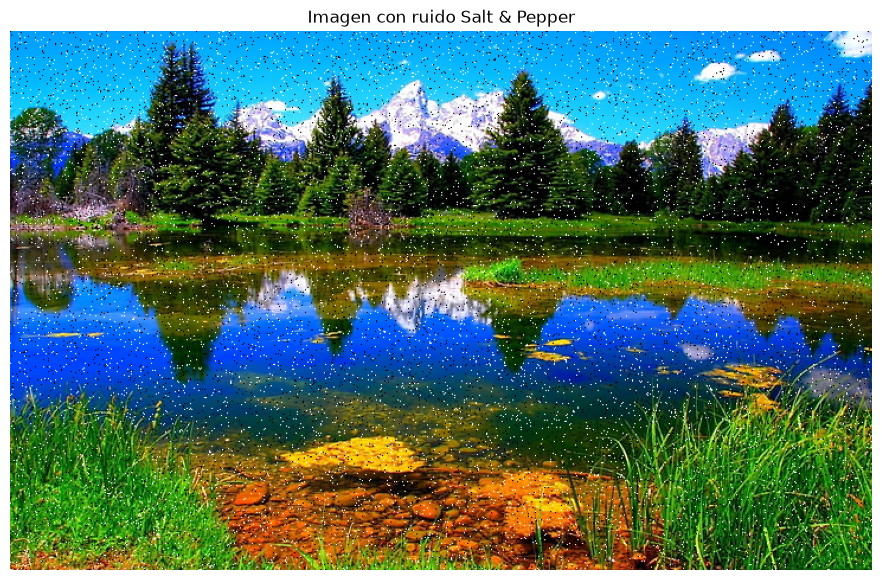

In [4]:
imagen_ruido = agregar_ruido_salt_pepper(imagen, porcentaje=0.05)

imagen_ruido_rgb = cv2.cvtColor(imagen_ruido, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_ruido_rgb)
plt.title("Imagen con ruido Salt & Pepper")
plt.axis("off")
plt.show()

## 3. Filtrado manual mediante convolución

Se implementa manualmente una convolución utilizando un kernel de media de 3x3. El objetivo es reducir el ruido reemplazando cada píxel por un valor calculado a partir de sus vecinos.

En esta implementación no se utilizan funciones de filtrado de OpenCV.

In [5]:
def convolucion_manual(imagen, kernel):
    alto, ancho, canales = imagen.shape

    k_alto, k_ancho = kernel.shape

    margen_y = k_alto // 2
    margen_x = k_ancho // 2

    # Agregar borde alrededor de la imagen
    imagen_padding = np.pad(
        imagen,
        (
            (margen_y, margen_y),
            (margen_x, margen_x),
            (0, 0)
        ),
        mode="edge"
    )

    # Imagen donde guardaremos el resultado
    resultado = np.zeros_like(imagen, dtype=np.float64)

    # Recorrer cada píxel
    for y in range(alto):
        for x in range(ancho):

            # Extraer vecindario 3x3
            region = imagen_padding[
                y:y + k_alto,
                x:x + k_ancho
            ]

            # Aplicar el kernel a cada canal BGR
            for canal in range(canales):
                resultado[y, x, canal] = np.sum(
                    region[:, :, canal] * kernel
                )

    # Limitar resultados al rango válido de una imagen
    resultado = np.clip(resultado, 0, 255)

    return resultado.astype(np.uint8)

In [6]:
kernel_media = np.ones((3, 3), dtype=np.float64) / 9

print(kernel_media)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


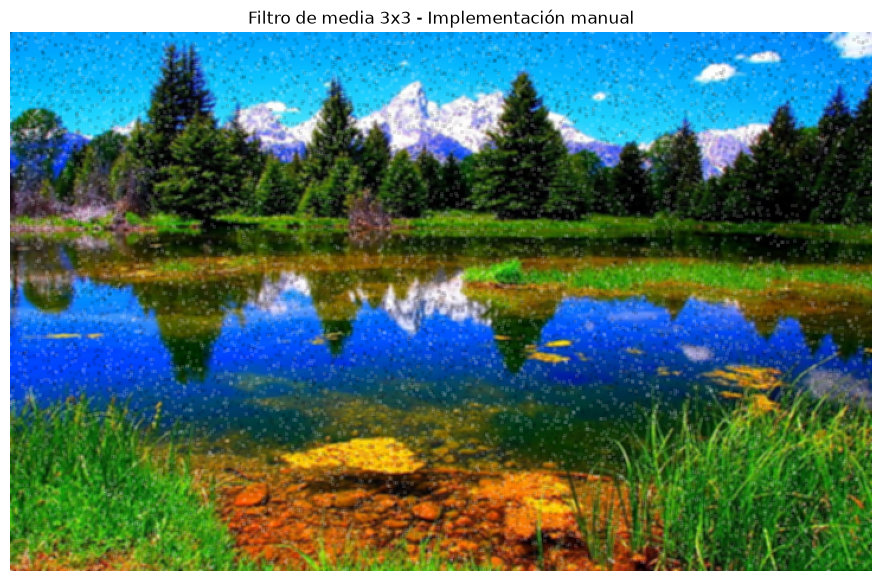

In [7]:
imagen_media = convolucion_manual(
    imagen_ruido,
    kernel_media
)

imagen_media_rgb = cv2.cvtColor(
    imagen_media,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_media_rgb)
plt.title("Filtro de media 3x3 - Implementación manual")
plt.axis("off")
plt.show()

## 4. Filtro de mediana manual

Se implementa manualmente un filtro de mediana de 3x3. Para cada píxel se toman los valores de su vecindario, se ordenan y se selecciona el valor central.

Este filtro es especialmente adecuado para ruido Salt & Pepper, ya que los valores extremos 0 y 255 tienen menor influencia sobre la mediana que sobre el promedio.

In [8]:
def filtro_mediana_manual(imagen, tamano=3):
    alto, ancho, canales = imagen.shape
    margen = tamano // 2

    # Agregar bordes
    imagen_padding = np.pad(
        imagen,
        (
            (margen, margen),
            (margen, margen),
            (0, 0)
        ),
        mode="edge"
    )

    resultado = np.zeros_like(imagen)

    # Recorrer cada píxel
    for y in range(alto):
        for x in range(ancho):

            region = imagen_padding[
                y:y + tamano,
                x:x + tamano
            ]

            # Calcular mediana de cada canal
            for canal in range(canales):
                valores = region[:, :, canal].flatten()
                valores_ordenados = sorted(valores)

                mediana = valores_ordenados[len(valores_ordenados) // 2]

                resultado[y, x, canal] = mediana

    return resultado

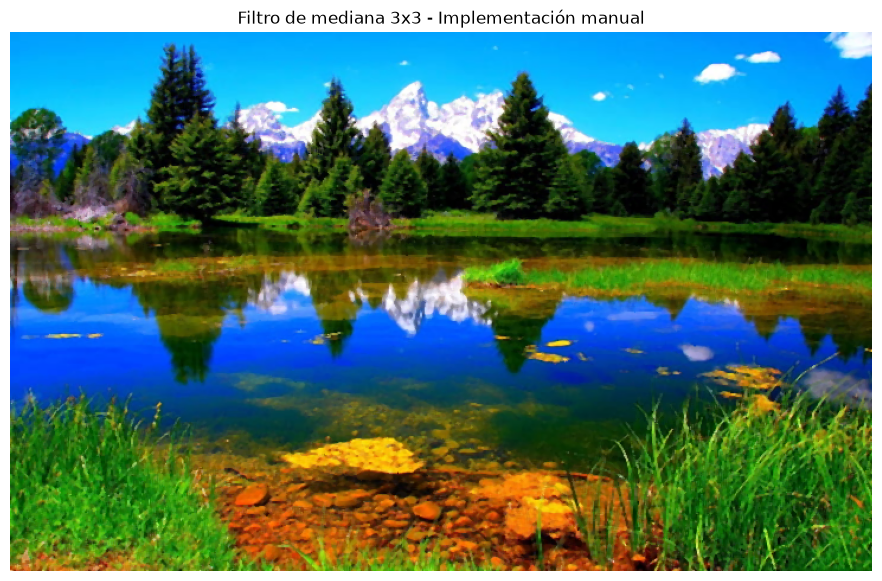

In [9]:
imagen_mediana_manual = filtro_mediana_manual(
    imagen_ruido,
    tamano=3
)

imagen_mediana_manual_rgb = cv2.cvtColor(
    imagen_mediana_manual,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_mediana_manual_rgb)
plt.title("Filtro de mediana 3x3 - Implementación manual")
plt.axis("off")
plt.show()

## 5. Comparación con OpenCV

Después de implementar manualmente el filtro de mediana, se utiliza la función `cv2.medianBlur()` de OpenCV para aplicar el mismo tipo de filtrado y comparar los resultados.

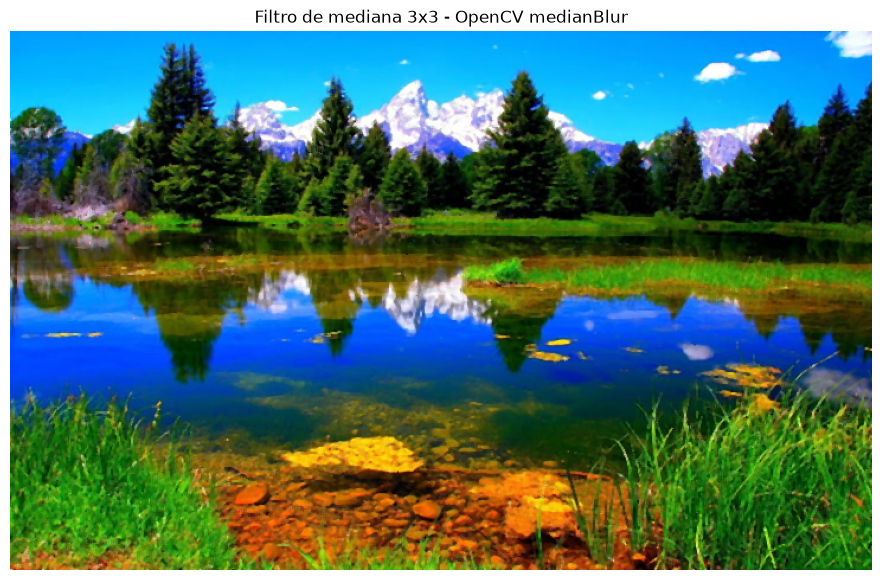

In [10]:
imagen_mediana_opencv = cv2.medianBlur(
    imagen_ruido,
    3
)

imagen_mediana_opencv_rgb = cv2.cvtColor(
    imagen_mediana_opencv,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_mediana_opencv_rgb)
plt.title("Filtro de mediana 3x3 - OpenCV medianBlur")
plt.axis("off")
plt.show()

## 6. Comparación de tiempos

Se mide el tiempo de ejecución del filtro de mediana implementado manualmente y de la función `cv2.medianBlur()` de OpenCV, utilizando en ambos casos un vecindario de 3x3.

In [11]:
import time

# Mediana manual
inicio_manual = time.perf_counter()

resultado_manual = filtro_mediana_manual(
    imagen_ruido,
    tamano=3
)

fin_manual = time.perf_counter()
tiempo_manual = fin_manual - inicio_manual


# Mediana con OpenCV
inicio_opencv = time.perf_counter()

resultado_opencv = cv2.medianBlur(
    imagen_ruido,
    3
)

fin_opencv = time.perf_counter()
tiempo_opencv = fin_opencv - inicio_opencv


print("Tiempo filtro mediana manual:", tiempo_manual, "segundos")
print("Tiempo cv2.medianBlur():", tiempo_opencv, "segundos")

Tiempo filtro mediana manual: 2.5798624999588355 segundos
Tiempo cv2.medianBlur(): 0.0004152000183239579 segundos


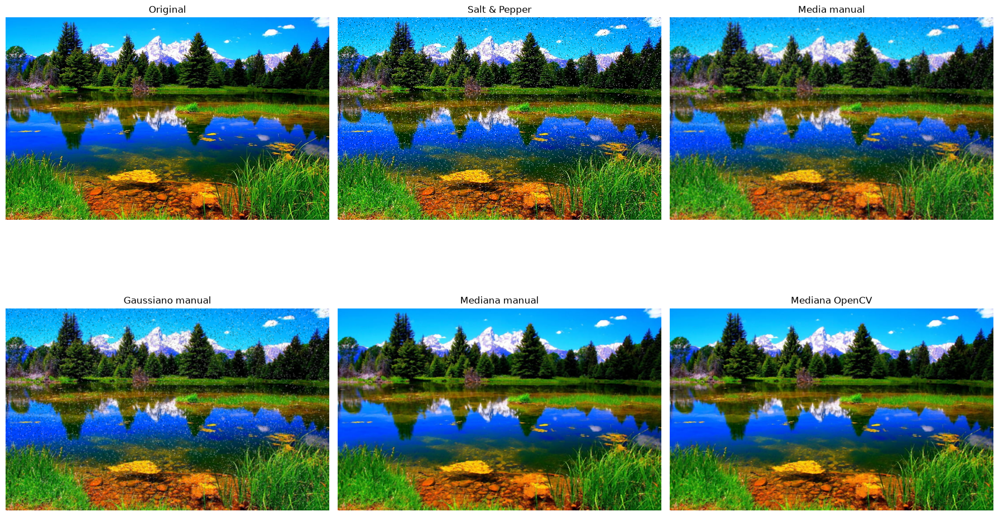

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(imagen_rgb)
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")

axes[0, 1].imshow(imagen_ruido_rgb)
axes[0, 1].set_title("Salt & Pepper")
axes[0, 1].axis("off")

axes[0, 2].imshow(imagen_media_rgb)
axes[0, 2].set_title("Media manual")
axes[0, 2].axis("off")

axes[1, 0].imshow(imagen_gaussiana_rgb)
axes[1, 0].set_title("Gaussiano manual")
axes[1, 0].axis("off")

axes[1, 1].imshow(imagen_mediana_manual_rgb)
axes[1, 1].set_title("Mediana manual")
axes[1, 1].axis("off")

axes[1, 2].imshow(imagen_mediana_opencv_rgb)
axes[1, 2].set_title("Mediana OpenCV")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

## 7. Filtro Gaussiano manual

Se aplica un filtro Gaussiano de 3x3 utilizando la función de convolución implementada manualmente. Este filtro asigna un mayor peso al píxel central y a sus vecinos cercanos, produciendo un suavizado ponderado de la imagen.

El kernel utilizado es:

1  2  1
2  4  2
1  2  1

dividido entre 16 para que la suma total de sus coeficientes sea igual a 1.

In [14]:
kernel_gaussiano = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
], dtype=np.float64) / 16

print("Kernel Gaussiano:")
print(kernel_gaussiano)

Kernel Gaussiano:
[[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]


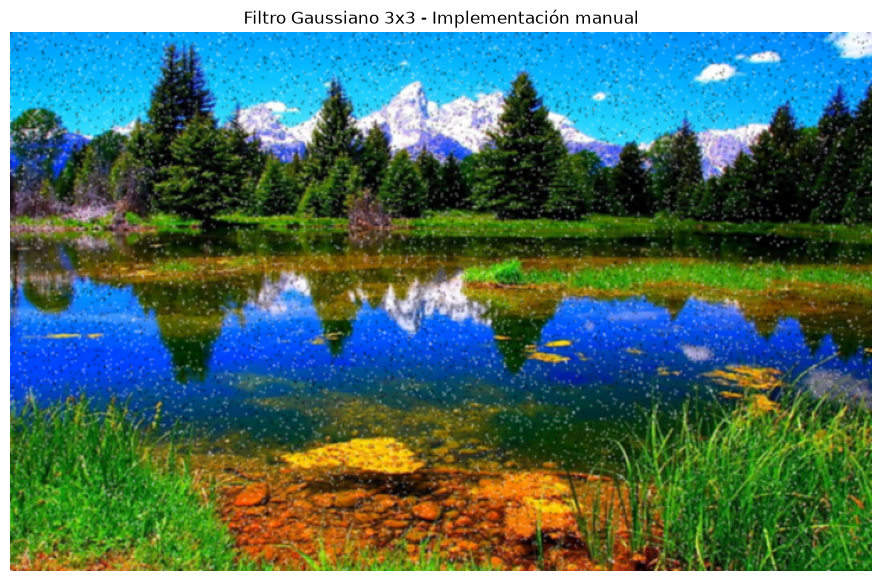

In [15]:
imagen_gaussiana = convolucion_manual(
    imagen_ruido,
    kernel_gaussiano
)

imagen_gaussiana_rgb = cv2.cvtColor(
    imagen_gaussiana,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(imagen_gaussiana_rgb)
plt.title("Filtro Gaussiano 3x3 - Implementación manual")
plt.axis("off")
plt.show()

## 8. Análisis de resultados

Al añadir ruido Salt & Pepper a la imagen original se observaron numerosos píxeles negros y blancos distribuidos aleatoriamente. Estos valores corresponden a los extremos de intensidad 0 y 255 y afectan de manera notable la calidad visual de la imagen.

El primer método probado fue un filtro de media de 3x3 implementado manualmente. Este filtro logró disminuir parte del ruido, ya que reemplaza cada píxel por el promedio de los valores presentes en su vecindario. Sin embargo, también produjo un efecto de desenfoque y pérdida de definición en los detalles de la imagen. Esto ocurre porque los valores extremos producidos por el ruido Salt & Pepper participan directamente en el cálculo del promedio.

Posteriormente se implementó manualmente un filtro de mediana de 3x3. Este método produjo un resultado visual superior para este tipo de ruido. La mayoría de los puntos blancos y negros desaparecieron y los bordes y detalles de la imagen se conservaron mejor que con el filtro de media. La mediana resulta menos sensible a valores extremos porque selecciona el valor central de los datos ordenados del vecindario en lugar de calcular su promedio.

Finalmente, se utilizó la función `cv2.medianBlur()` de OpenCV con un tamaño de ventana de 3x3. Visualmente, el resultado fue muy similar al obtenido mediante la implementación manual del filtro de mediana.

La diferencia más notable se presentó en el tiempo de procesamiento. La implementación manual necesitó aproximadamente **2.5799 segundos**, mientras que `cv2.medianBlur()` necesitó aproximadamente **0.000415 segundos** en la prueba realizada.

Esto demuestra que la implementación manual permite comprender detalladamente el funcionamiento del algoritmo, mientras que las funciones optimizadas de OpenCV ofrecen una ventaja considerable en velocidad de procesamiento.

## 9. Conclusiones

1. El ruido Salt & Pepper modifica aleatoriamente algunos píxeles de una imagen asignándoles valores extremos de 0 o 255, generando puntos negros y blancos visibles.

2. El filtro de media permite reducir parcialmente este tipo de ruido, pero también produce un mayor suavizado de la imagen y puede provocar pérdida de detalles.

3. El filtro de mediana presentó mejores resultados visuales frente al ruido Salt & Pepper, debido a que los valores extremos tienen menor influencia sobre la mediana.

4. La implementación manual permitió comprender cómo se recorre el vecindario de cada píxel y cómo se calcula el nuevo valor resultante sin depender de funciones de filtrado de OpenCV.

5. El filtro de mediana implementado manualmente y `cv2.medianBlur()` produjeron resultados visualmente similares utilizando una ventana de 3x3.

6. OpenCV presentó una diferencia considerable en eficiencia. En la prueba realizada, el filtro manual necesitó aproximadamente 2.5799 segundos, mientras que `cv2.medianBlur()` tardó aproximadamente 0.000415 segundos.

7. Para el ruido Salt & Pepper utilizado en esta práctica, el filtro de mediana resultó más adecuado que el filtro de media debido a su capacidad para eliminar valores atípicos conservando mejor los detalles de la imagen.